<a href="https://colab.research.google.com/github/victorbahlangene/Fastai-Docs/blob/main/Tutorials_Intermediate.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -q nbdev

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.8/64.8 kB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.7/58.7 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.1/82.1 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 42.0 MB/s eta 0:00:00


In [2]:
!pip install -Uqq fastbook

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 kB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 13.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.6/519.6 kB 14.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 16.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 14.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 16.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.8/294.8 kB 15.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 19.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 21.1 MB/s eta 0:00:00


# Data block tutorial
Using the data block across all applications

## Building a DataBlock from scratch

In [3]:
from fastai.data.all import *
from fastai.vision.all import *

In [ ]:
path = untar_data(URLs.PETS)
path.ls()

(#2) [Path('/root/.fastai/data/oxford-iiit-pet/annotations'),Path('/root/.fastai/data/oxford-iiit-pet/images')]

In [ ]:
(path/"images").ls()

(#7393) [Path('/root/.fastai/data/oxford-iiit-pet/images/boxer_141.jpg'),Path('/root/.fastai/data/oxford-iiit-pet/images/great_pyrenees_127.jpg'),Path('/root/.fastai/data/oxford-iiit-pet/images/Bengal_171.jpg'),Path('/root/.fastai/data/oxford-iiit-pet/images/scottish_terrier_86.jpg'),Path('/root/.fastai/data/oxford-iiit-pet/images/havanese_35.jpg'),Path('/root/.fastai/data/oxford-iiit-pet/images/staffordshire_bull_terrier_2.jpg'),Path('/root/.fastai/data/oxford-iiit-pet/images/Egyptian_Mau_139.jpg'),Path('/root/.fastai/data/oxford-iiit-pet/images/havanese_107.jpg'),Path('/root/.fastai/data/oxford-iiit-pet/images/great_pyrenees_100.jpg'),Path('/root/.fastai/data/oxford-iiit-pet/images/Bombay_98.jpg')...]

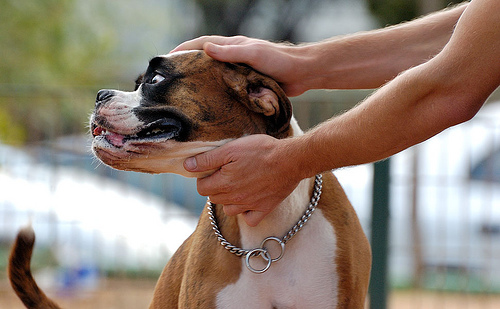

In [ ]:
fnames = get_image_files(path/"images")
PILImage.create(fnames[0])

In [ ]:
dblock = DataBlock()
dsets = dblock.datasets(fnames)
dsets.train[0]

(Path('/root/.fastai/data/oxford-iiit-pet/images/Persian_129.jpg'),
 Path('/root/.fastai/data/oxford-iiit-pet/images/Persian_129.jpg'))

In [ ]:
doc(dblock.datasets)

In [ ]:
doc(DataBlock)

In [ ]:
dblock = DataBlock(get_items=get_image_files)
dsets = dblock.datasets(path/"images")
dsets.train[0]

(Path('/root/.fastai/data/oxford-iiit-pet/images/Maine_Coon_33.jpg'),
 Path('/root/.fastai/data/oxford-iiit-pet/images/Maine_Coon_33.jpg'))

In [ ]:
print(fnames[0],"\n", fnames[0].name, "\n",fnames[0].name[0])

/root/.fastai/data/oxford-iiit-pet/images/boxer_141.jpg 
 boxer_141.jpg 
 b


In [ ]:
def label_func(fname):
    return "cat" if fname.name[0].isupper() else "dog"

label_func(fnames[0])

'dog'

In [ ]:
set_seed(42)

dblock = DataBlock(get_items=get_image_files,
                   get_y=label_func)

dsets = dblock.datasets(path/"images")
dsets.train[0]

(Path('/root/.fastai/data/oxford-iiit-pet/images/basset_hound_36.jpg'), 'dog')

In [ ]:
set_seed(42)
dblock = DataBlock(blocks    = (ImageBlock, CategoryBlock),
                   get_items = get_image_files,
                   get_y     = label_func)

dsets = dblock.datasets(path/"images")
dsets.train[0]

(PILImage mode=RGB size=500x333, TensorCategory(1))

In [ ]:
dsets.vocab

['cat', 'dog']

In [ ]:
set_seed(42)

dblock = DataBlock(blocks    = (ImageBlock, CategoryBlock),
                   get_items = get_image_files,
                   get_y     = label_func,
                   splitter  = RandomSplitter())

dsets = dblock.datasets(path/"images")
dsets.train[0]

(PILImage mode=RGB size=500x333, TensorCategory(1))

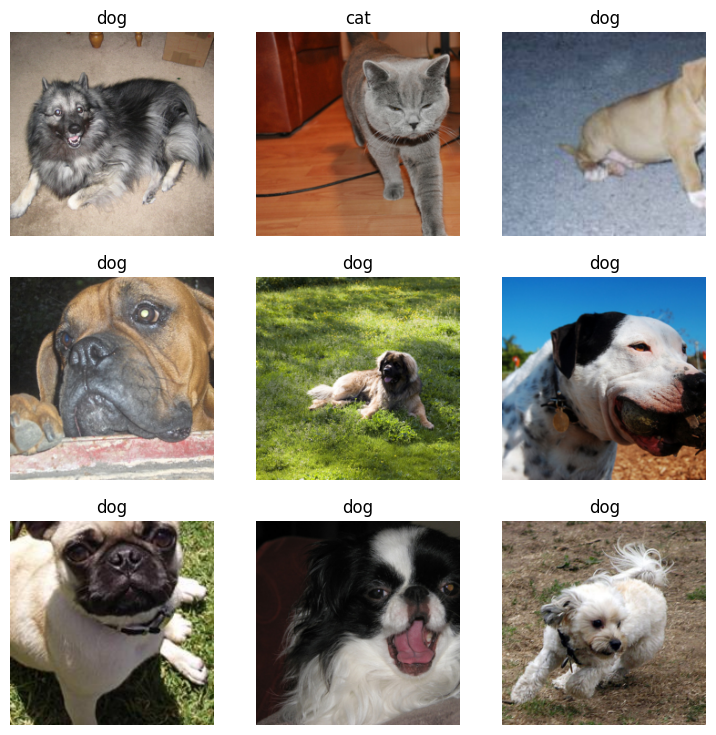

In [ ]:
dblock = DataBlock(blocks    = (ImageBlock, CategoryBlock),
                   get_items = get_image_files,
                   get_y     = label_func,
                   splitter  = RandomSplitter(),
                   item_tfms = Resize(224))

dls = dblock.dataloaders(path/"images")
dls.show_batch()

## Image classification

In [ ]:
from fastai.vision.all import *

### MNIST (single label)


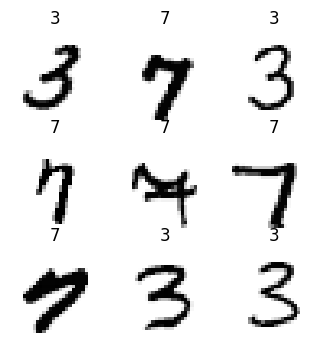

In [ ]:
mnist = DataBlock(blocks=(ImageBlock(cls=PILImageBW), CategoryBlock),
                  get_items=get_image_files,
                  splitter=GrandparentSplitter(),
                  get_y=parent_label)

dls = mnist.dataloaders(untar_data(URLs.MNIST_TINY))
dls.show_batch(max_n=9, figsize=(4,4))

In [ ]:
mnist.summary(untar_data(URLs.MNIST_TINY))

Setting-up type transforms pipelines
Found 1428 items
2 datasets of sizes 709,699
Setting up Pipeline: PILBase.create
Setting up Pipeline: parent_label -> Categorize -- {'vocab': None, 'sort': True, 'add_na': False}

Building one sample
  Pipeline: PILBase.create
    starting from
      /root/.fastai/data/mnist_tiny/train/3/8818.png
    applying PILBase.create gives
      PILImageBW mode=L size=28x28
  Pipeline: parent_label -> Categorize -- {'vocab': None, 'sort': True, 'add_na': False}
    starting from
      /root/.fastai/data/mnist_tiny/train/3/8818.png
    applying parent_label gives
      3
    applying Categorize -- {'vocab': None, 'sort': True, 'add_na': False} gives
      TensorCategory(0)

Final sample: (PILImageBW mode=L size=28x28, TensorCategory(0))


Found 1428 items
2 datasets of sizes 709,699
Setting up Pipeline: PILBase.create
Setting up Pipeline: parent_label -> Categorize -- {'vocab': None, 'sort': True, 'add_na': False}
Setting up after_item: Pipeline: ToTensor
Sett

### Pets (single label)

In [ ]:
doc(Pipeline)

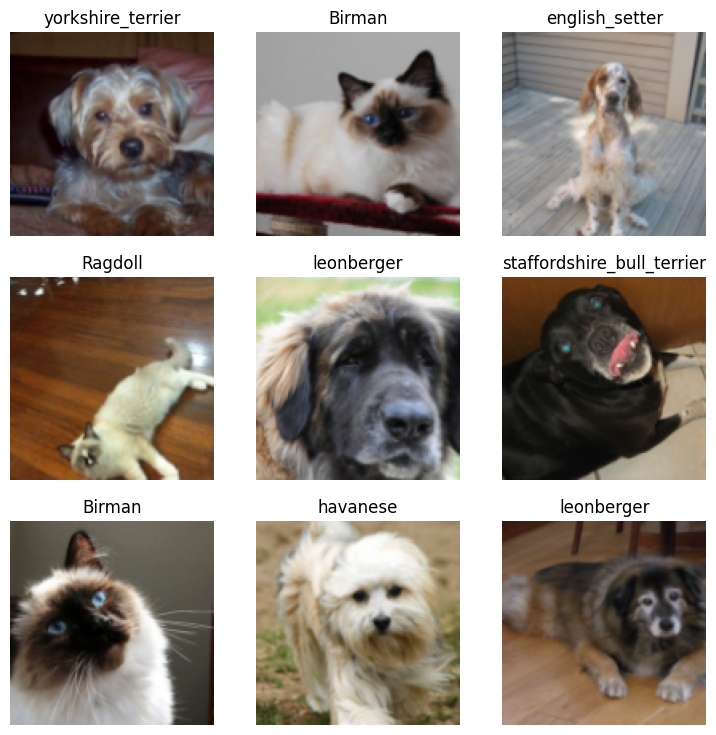

In [ ]:
pets = DataBlock(blocks=(ImageBlock, CategoryBlock),
                 get_items=get_image_files,
                 splitter=RandomSplitter(),
                 get_y=Pipeline([attrgetter("name"), RegexLabeller(pat = r'^(.*)_\d+.jpg$')]),
                 item_tfms=Resize(128),
                 batch_tfms=aug_transforms())

dls = pets.dataloaders(untar_data(URLs.PETS)/"images")
dls.show_batch(max_n=9)

### Pascal (multi-label)

In [ ]:
pascal_source = untar_data(URLs.PASCAL_2007)
df = pd.read_csv(pascal_source/"train.csv")

In [ ]:
doc(ColSplitter)

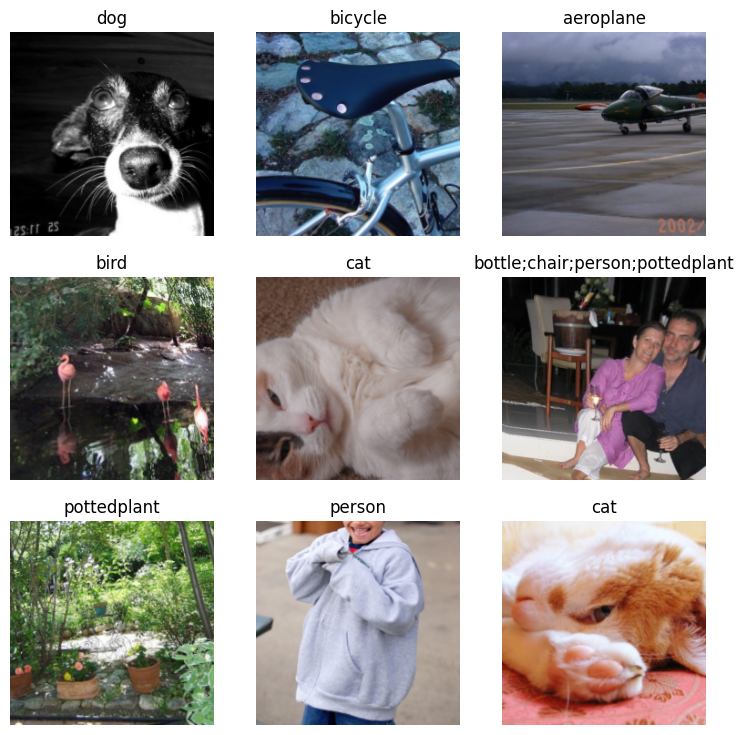

In [ ]:
set_seed(42)

pascal = DataBlock(blocks=(ImageBlock, MultiCategoryBlock),
                   splitter=ColSplitter(),
                   get_x=ColReader(0, pref=pascal_source/"train"),
                   get_y=ColReader(1, label_delim=' '),
                   item_tfms=Resize(224),
                   batch_tfms=aug_transforms())

dls = pascal.dataloaders(df)
dls.show_batch()

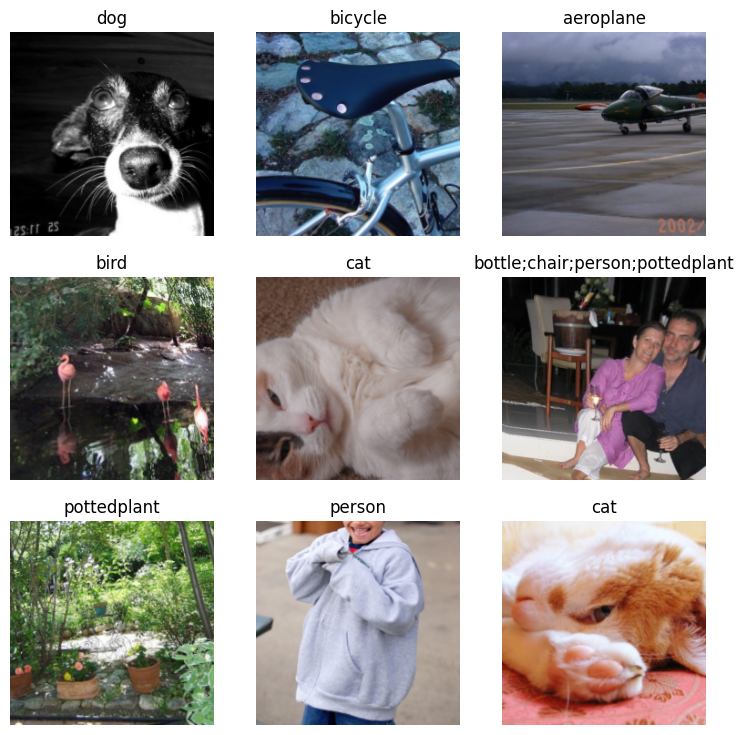

In [ ]:
set_seed(42)

pascal = DataBlock(blocks=(ImageBlock, MultiCategoryBlock),
                   splitter=ColSplitter(),
                   get_x=lambda x:pascal_source/"train"/f'{x[0]}',
                   get_y=lambda x:x[1].split(' '),
                   item_tfms=Resize(224),
                   batch_tfms=aug_transforms())

dls = pascal.dataloaders(df)
dls.show_batch()

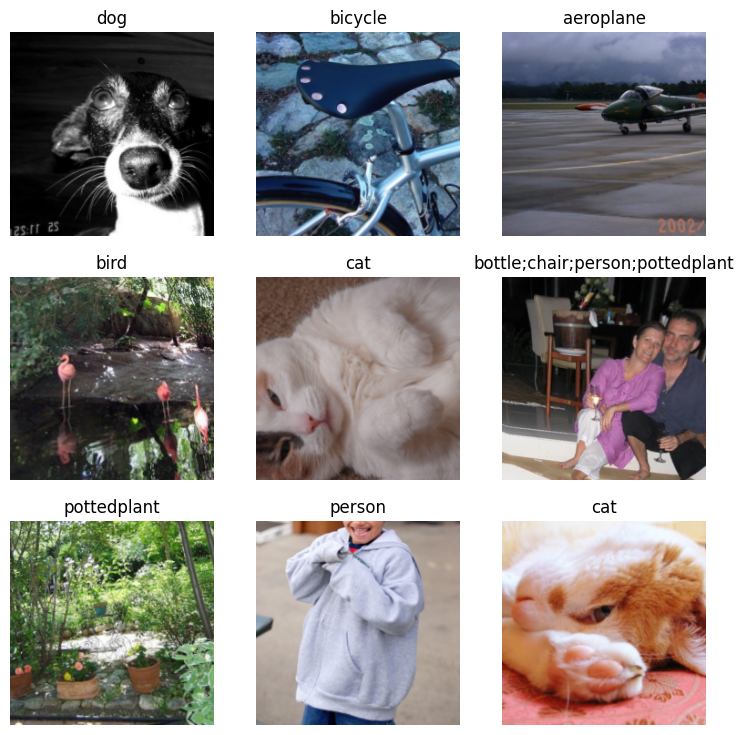

In [ ]:
set_seed(42)

pascal = DataBlock(blocks=(ImageBlock, MultiCategoryBlock),
                   splitter=ColSplitter(),
                   get_x=lambda o:f'{pascal_source}/train/'+o.fname,
                   get_y=lambda o:o.labels.split(),
                   item_tfms=Resize(224),
                   batch_tfms=aug_transforms())

dls = pascal.dataloaders(df)
dls.show_batch()

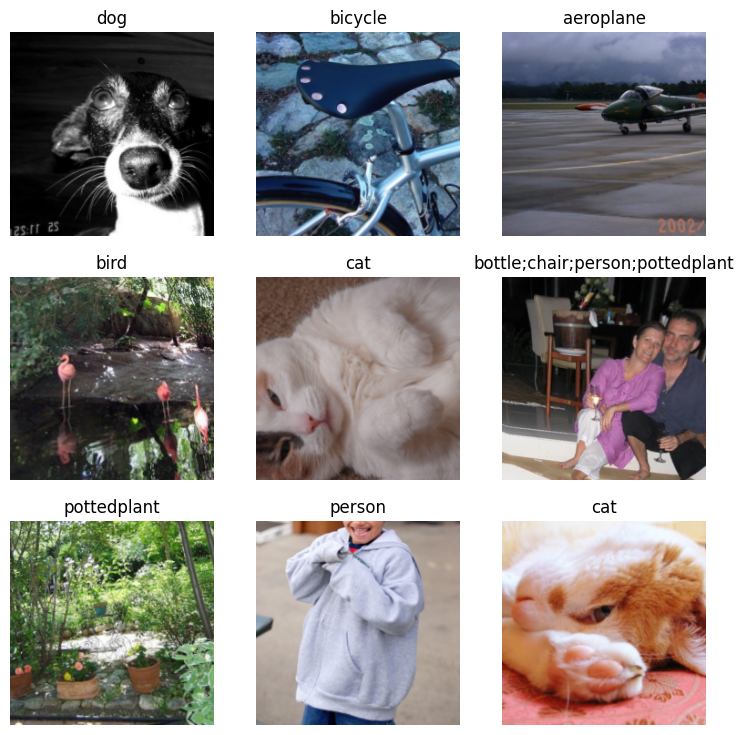

In [ ]:
set_seed(42)

def _pascal_items(x): return (
    f'{pascal_source}/train/'+x.fname, x.labels.str.split())
valid_idx = df[df['is_valid']].index.values

pascal = DataBlock.from_columns(blocks=(ImageBlock, MultiCategoryBlock),
                   get_items=_pascal_items,
                   splitter=IndexSplitter(valid_idx),
                   item_tfms=Resize(224),
                   batch_tfms=aug_transforms())

dls = pascal.dataloaders(df)
dls.show_batch()

## Image localization

There are various problems that fall in the image localization category: image segmentation (which is a task where you have to predict the class of each pixel of an image), coordinate predictions (predict one or several key points on an image) and object detection (draw a box around objects to detect).

Let’s see an example of each of those and how to use the data block API in each case.

### Segmentation

In [ ]:
path = untar_data(URLs.CAMVID_TINY)

In [ ]:
path.ls()

(#3) [Path('/root/.fastai/data/camvid_tiny/labels'),Path('/root/.fastai/data/camvid_tiny/codes.txt'),Path('/root/.fastai/data/camvid_tiny/images')]

In [ ]:
(path/"labels").ls()

(#100) [Path('/root/.fastai/data/camvid_tiny/labels/0016E5_01920_P.png'),Path('/root/.fastai/data/camvid_tiny/labels/0001TP_007500_P.png'),Path('/root/.fastai/data/camvid_tiny/labels/0016E5_05940_P.png'),Path('/root/.fastai/data/camvid_tiny/labels/Seq05VD_f02070_P.png'),Path('/root/.fastai/data/camvid_tiny/labels/0016E5_08141_P.png'),Path('/root/.fastai/data/camvid_tiny/labels/0016E5_07995_P.png'),Path('/root/.fastai/data/camvid_tiny/labels/Seq05VD_f01260_P.png'),Path('/root/.fastai/data/camvid_tiny/labels/Seq05VD_f02370_P.png'),Path('/root/.fastai/data/camvid_tiny/labels/0016E5_08009_P.png'),Path('/root/.fastai/data/camvid_tiny/labels/Seq05VD_f04950_P.png')...]

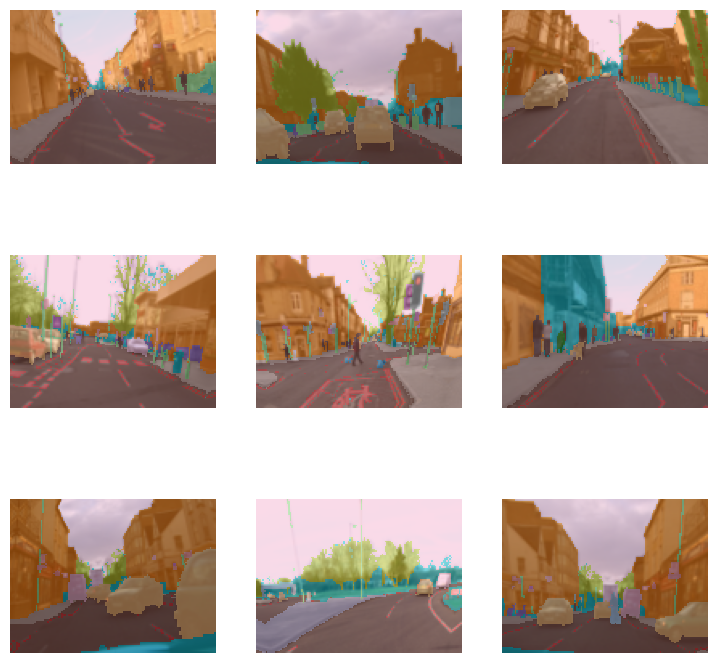

In [ ]:
camvid = DataBlock(blocks=(ImageBlock, MaskBlock(codes = np.loadtxt(path/'codes.txt', dtype=str))),
    get_items=get_image_files,
    splitter=RandomSplitter(),
    get_y=lambda o: path/'labels'/f'{o.stem}_P{o.suffix}',
    batch_tfms=aug_transforms())

dls = camvid.dataloaders(path/"images")
dls.show_batch()

### Points
For this example we will use a small sample of the BiWi kinect head pose dataset. It contains pictures of people and the task is to predict where the center of their head is. We have saved this small dataet with a dictionary filename to center:

In [ ]:
biwi_source = untar_data(URLs.BIWI_SAMPLE)
fn2ctr = load_pickle(biwi_source/'centers.pkl')

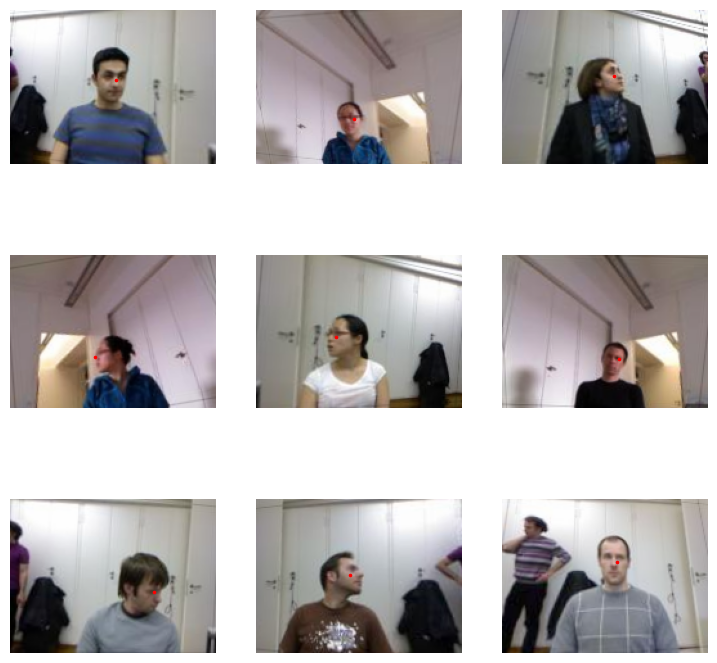

In [ ]:
biwi = DataBlock(blocks=(ImageBlock, PointBlock),
                 get_items=get_image_files,
                 splitter=RandomSplitter(),
                 get_y=lambda o:fn2ctr[o.name].flip(0),
                 batch_tfms=aug_transforms())

dls = biwi.dataloaders(biwi_source)
dls.show_batch(max_n=9)

### Bounding boxes
For this task, we will use a small subset of the COCO dataset. It contains pictures with day-to-day objects and the goal is to predict where the objects are by drawing a rectangle around them.

The fastai library comes with a function called get_annotations that will interpret the content of train.json and give us a dictionary filename to (bounding boxes, labels).

In [ ]:
coco_source = untar_data(URLs.COCO_TINY)
images, lbl_bbox = get_annotations(coco_source/'train.json')
img2bbox = dict(zip(images, lbl_bbox))

Then we can go over our usual questions:

- what are the types of our inputs and targets? Images and bounding boxes.
- where is the data? In subfolders.
- how do we know if a sample is in the training or the validation set? We’ll take a random split.
- how do we know the label of an image? By using the img2bbox dictionary.
- do we want to apply a function to a given sample? Yes, we need to resize everything to a given size.
- do we want to apply a function to a batch after it’s created? Yes, we want data augmentation.

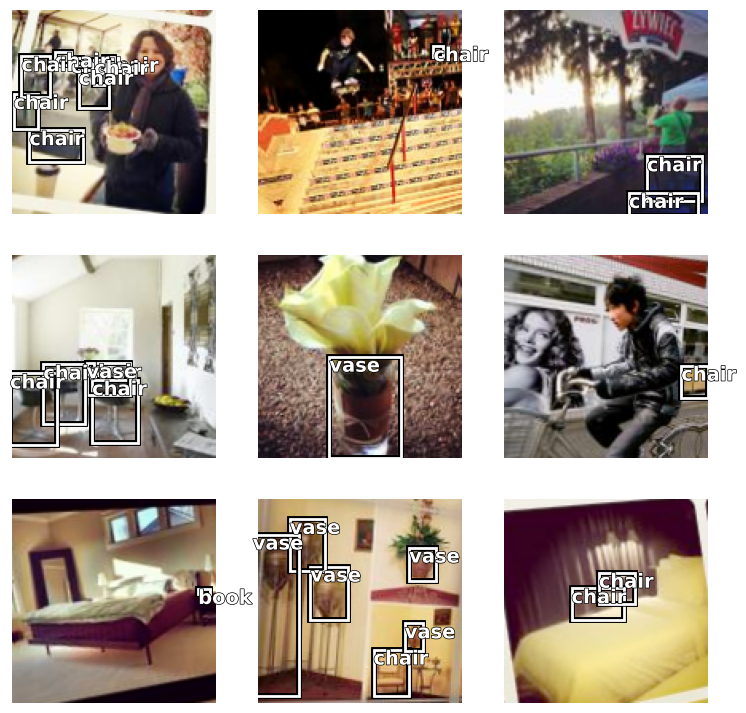

In [ ]:
coco = DataBlock(blocks=(ImageBlock, BBoxBlock, BBoxLblBlock),
                 get_items=get_image_files,
                 splitter=RandomSplitter(),
                 get_y=[lambda o: img2bbox[o.name][0], lambda o: img2bbox[o.name][1]],
                 item_tfms=Resize(128),
                 batch_tfms=aug_transforms(),
                 n_inp=1)

dls = coco.dataloaders(coco_source)
dls.show_batch(max_n=9)

Note that we provide three types, because we have two targets: the bounding boxes and the labels. That’s why we pass n_inp=1 at the end, to tell the library where the inputs stop and the targets begin.

This is also why we pass a list to get_y: since we have two targets, we must tell the library how to label for each of them (you can use noop if you don’t want to do anything for one).

## Tabular data

In [ ]:
from fastai.tabular.core import *

In [ ]:
adult_source = untar_data(URLs.ADULT_SAMPLE)
df = pd.read_csv(adult_source/'adult.csv')
df.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,salary
0,49,Private,101320,Assoc-acdm,12.0,Married-civ-spouse,NaN,Wife,White,Female,0,1902,40,United-States,>=50k
1,44,Private,236746,Masters,14.0,Divorced,Exec-managerial,Not-in-family,White,Male,10520,0,45,United-States,>=50k
2,38,Private,96185,HS-grad,NaN,Divorced,NaN,Unmarried,Black,Female,0,0,32,United-States,<50k
3,38,Self-emp-inc,112847,Prof-school,15.0,Married-civ-spouse,Prof-specialty,Husband,Asian-Pac-Islander,Male,0,0,40,United-States,>=50k
4,42,Self-emp-not-inc,82297,7th-8th,NaN,Married-civ-spouse,Other-service,Wife,Black,Female,0,0,50,United-States,<50k


In [ ]:
cat_names = ['workclass', 'education', 'marital-status', 'occupation', 'relationship', 'race']
cont_names = ['age', 'fnlwgt', 'education-num']
procs = [Categorify, FillMissing, Normalize]
splits = RandomSplitter()(range_of(df))

to = TabularPandas(df, procs, cat_names, cont_names, y_names="salary", splits=splits, y_block=CategoryBlock)
dls = to.dataloaders()
dls.show_batch()

,workclass,education,marital-status,occupation,relationship,race,education-num_na,age,fnlwgt,education-num,salary
0,Private,HS-grad,Never-married,Machine-op-inspct,Unmarried,White,False,18.999999,85689.999512,9.0,<50k
1,Private,Bachelors,Never-married,Other-service,Not-in-family,Asian-Pac-Islander,False,53.000000,83434.000649,13.0,>=50k
2,Private,HS-grad,Divorced,Exec-managerial,Unmarried,Black,False,47.000000,176140.000109,9.0,>=50k
3,Self-emp-not-inc,HS-grad,Married-civ-spouse,Craft-repair,Husband,White,False,33.000000,116539.002030,9.0,<50k
4,Private,HS-grad,Separated,Machine-op-inspct,Not-in-family,White,False,42.000000,350387.003678,9.0,<50k
5,Private,Masters,Married-civ-spouse,Exec-managerial,Husband,White,False,45.000000,199058.000236,14.0,>=50k
6,Private,Bachelors,Never-married,Exec-managerial,Own-child,White,False,25.000000,90290.999942,13.0,<50k
7,?,11th,Never-married,?,Own-child,White,False,17.000000,198796.999649,7.0,<50k
8,Self-emp-inc,Bachelors,Married-civ-spouse,Exec-managerial,Husband,White,False,39.000000,117555.001162,13.0,>=50k
9,Self-emp-not-inc,HS-grad,Married-civ-spouse,Farming-fishing,Husband,White,False,52.000000,135716.002906,9.0,<50k


# Training Imagenette
A dive into the layered API of fastai in computer vision

Imagenette is a subset of ImageNet with 10 very different classes. It’s great to quickly experiment before trying a fleshed-out technique on the full ImageNet dataset. We will show in this tutorial how to train a model on it, using the usual high-level APIs, then delving inside the fastai library to show you how to use the mid-level APIs we designed. This way you’ll be able to customize your own data collection or training as needed.



## Assemble the data

### Loading the data with a factory method(application layer)

In [7]:
from fastai.vision.all import *

path = untar_data(URLs.IMAGENETTE_160)

In [8]:
doc(ImageDataLoaders.from_folder)

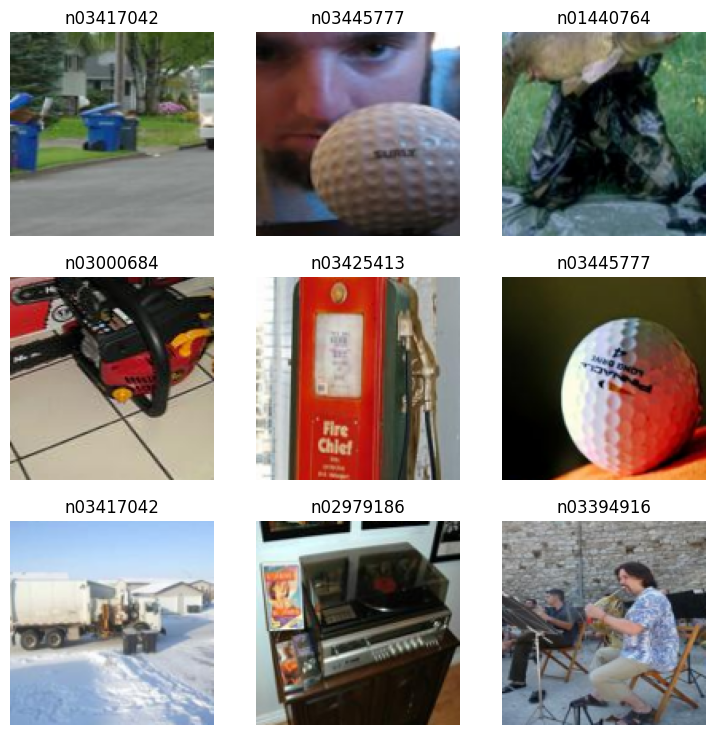

In [9]:
dls = ImageDataLoaders.from_folder(path, valid='val',
    item_tfms=RandomResizedCrop(128, min_scale=0.35), batch_tfms=Normalize.from_stats(*imagenet_stats))

dls.show_batch()

### Loading the data with the data block API(High-level API)

In [10]:
path

Path('/root/.fastai/data/imagenette2-160')

In [11]:
path.ls()

(#4) [Path('/root/.fastai/data/imagenette2-160/.DS_Store'),Path('/root/.fastai/data/imagenette2-160/noisy_imagenette.csv'),Path('/root/.fastai/data/imagenette2-160/val'),Path('/root/.fastai/data/imagenette2-160/train')]

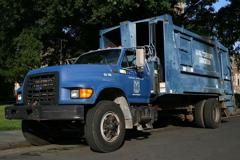

In [12]:
fnames = get_image_files(path)
PILImage.create(fnames[0])

In [13]:
dblock = DataBlock()

dsets = dblock.datasets(fnames)
dsets.train[0]

(Path('/root/.fastai/data/imagenette2-160/train/n03445777/n03445777_1737.JPEG'),
 Path('/root/.fastai/data/imagenette2-160/train/n03445777/n03445777_1737.JPEG'))

In [14]:
dblock = DataBlock(get_items = get_image_files)
dsets = dblock.datasets(path)
dsets.train[0]

(Path('/root/.fastai/data/imagenette2-160/train/n02979186/n02979186_26319.JPEG'),
 Path('/root/.fastai/data/imagenette2-160/train/n02979186/n02979186_26319.JPEG'))

In [15]:
print(fnames[0], "\n", parent_label(fnames[0]))

/root/.fastai/data/imagenette2-160/val/n03417042/n03417042_27861.JPEG 
 n03417042


In [16]:
lbl_dict = dict(
    n01440764='tench',
    n02102040='English springer',
    n02979186='cassette player',
    n03000684='chain saw',
    n03028079='church',
    n03394916='French horn',
    n03417042='garbage truck',
    n03425413='gas pump',
    n03445777='golf ball',
    n03888257='parachute'
)

In [17]:
lbl_dict[parent_label(fnames[0])]

'garbage truck'

In [18]:
def label_func(fname): return lbl_dict[parent_label(fname)]

In [19]:
dblock = DataBlock(get_items = get_image_files,
                   get_y = label_func)

dsets = dblock.datasets(path)
dsets.train[0]

(Path('/root/.fastai/data/imagenette2-160/train/n03425413/n03425413_8039.JPEG'),
 'gas pump')

In [20]:
dblock = DataBlock(blocks    = (ImageBlock, CategoryBlock),
                   get_items = get_image_files,
                   get_y     = label_func)

dsets = dblock.datasets(path)
print(f"Sample data: {dsets.train[0]} \n Vocab: {dsets.vocab}")

Sample data: (PILImage mode=RGB size=254x160, TensorCategory(2)) 
 Vocab: ['English springer', 'French horn', 'cassette player', 'chain saw', 'church', 'garbage truck', 'gas pump', 'golf ball', 'parachute', 'tench']


In [21]:
dblock = DataBlock(blocks    = (ImageBlock, CategoryBlock),
                   get_items = get_image_files,
                   get_y     = label_func,
                   splitter  = GrandparentSplitter())

dsets = dblock.datasets(path)
dsets.train[0]

(PILImage mode=RGB size=266x160, TensorCategory(5))

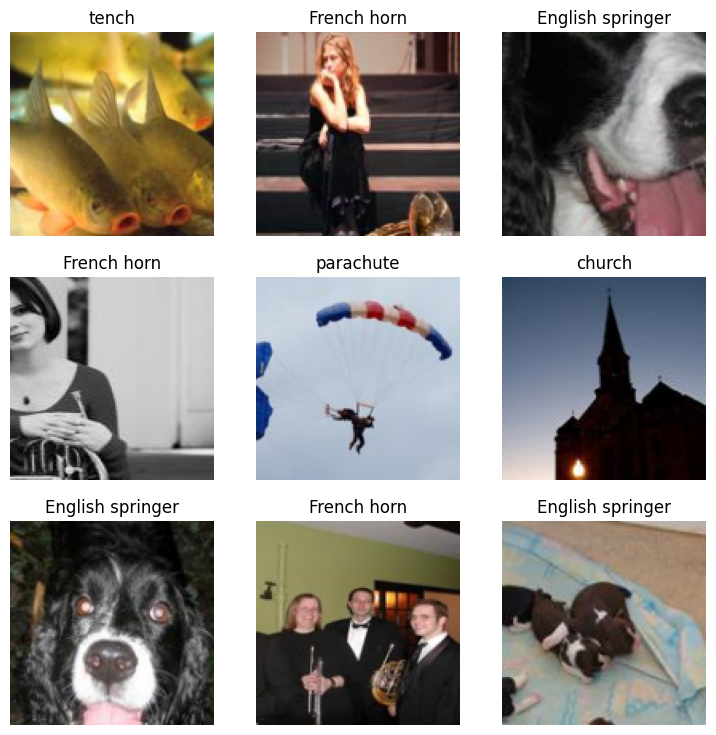

In [22]:
dblock = DataBlock(blocks    = (ImageBlock, CategoryBlock),
                   get_items = get_image_files,
                   get_y     = label_func,
                   splitter  = GrandparentSplitter(),
                   item_tfms = RandomResizedCrop(128, min_scale=0.35),
                   batch_tfms=Normalize.from_stats(*imagenet_stats))

dls = dblock.dataloaders(path)
dls.show_batch()

In [23]:
lbl_dict[parent_label(fnames[0])]

'garbage truck'

In [24]:
parent_label(fnames[0])

'n03417042'

In [25]:
label_func(fnames[0]), lbl_dict[parent_label(fnames[0])], lbl_dict.__getitem__(parent_label(fnames[0]))

('garbage truck', 'garbage truck', 'garbage truck')

In [26]:
Pipeline([parent_label, lbl_dict.__getitem__])

Pipeline: parent_label -> dict.__getitem__

In [27]:
lbl_pipe = Pipeline([parent_label, lbl_dict.__getitem__])
lbl_pipe((fnames[0]))

'garbage truck'

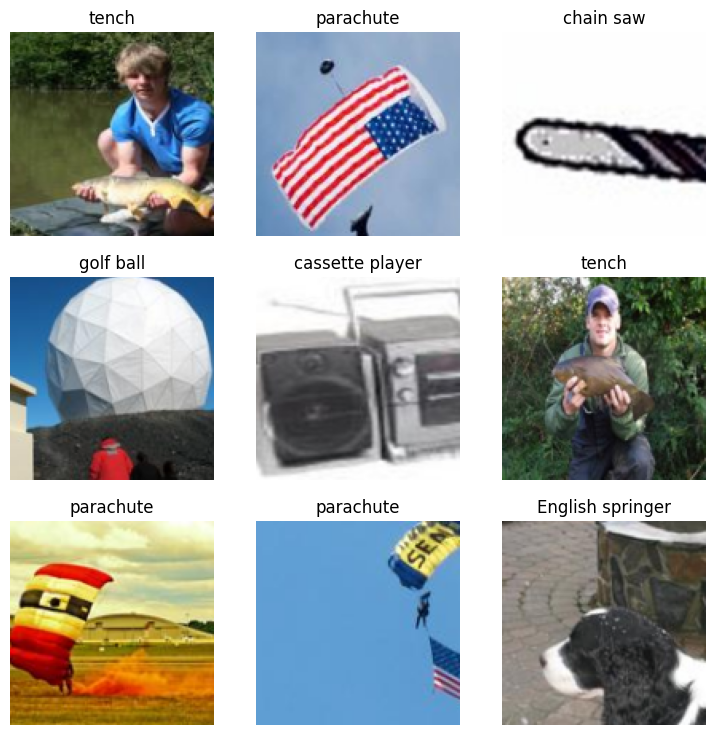

In [28]:
imagenette = DataBlock(blocks = (ImageBlock, CategoryBlock),
                       get_items = get_image_files,
                       get_y = Pipeline([parent_label, lbl_dict.__getitem__]),
                       splitter = GrandparentSplitter(valid_name='val'),
                       item_tfms = RandomResizedCrop(128, min_scale=0.35),
                       batch_tfms = Normalize.from_stats(*imagenet_stats))

dls = imagenette.dataloaders(path)
dls.show_batch()

### Loading the data with the mid-level API

In [29]:
source = untar_data(URLs.IMAGENETTE_160)
fnames = get_image_files(source)

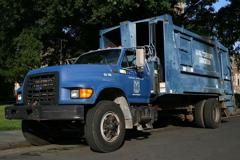

In [30]:
PILImage.create(fnames[0])

In [31]:
lbl_dict[parent_label(fnames[0])]

'garbage truck'

In [32]:
lbl_dict

{'n01440764': 'tench',
 'n02102040': 'English springer',
 'n02979186': 'cassette player',
 'n03000684': 'chain saw',
 'n03028079': 'church',
 'n03394916': 'French horn',
 'n03417042': 'garbage truck',
 'n03425413': 'gas pump',
 'n03445777': 'golf ball',
 'n03888257': 'parachute'}

In [33]:
lbl_dict.values()

dict_values(['tench', 'English springer', 'cassette player', 'chain saw', 'church', 'French horn', 'garbage truck', 'gas pump', 'golf ball', 'parachute'])

In [34]:
doc(Categorize)

In [35]:
tfm = Pipeline([parent_label, lbl_dict.__getitem__, Categorize(vocab = lbl_dict.values())])
tfm(fnames[0])

TensorCategory(5)

In [36]:
splits = GrandparentSplitter(valid_name='val')(fnames)

In [37]:
len(splits[0]),len(splits[1])

(9469, 3925)

In [38]:
doc(Datasets)

In [39]:
dsets = Datasets(fnames, [[PILImage.create], [parent_label, lbl_dict.__getitem__, Categorize]], splits=splits)
dsets[0]

(PILImage mode=RGB size=240x160, TensorCategory(5))

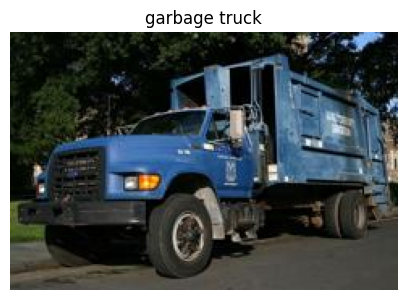

In [40]:
dsets.show(dsets[0]);

In [41]:
item_tfms = [ToTensor, RandomResizedCrop(128, min_scale=0.35)]

In [42]:
batch_tfms = [IntToFloatTensor, Normalize.from_stats(*imagenet_stats)]

Those two bits could be done per item as well, but it’s way more efficient to do it on a full batch.

Note that we have more transforms than in the data block API: there was no need to think of ToTensor or IntToFloatTensor there. This is because data blocks come with default item transforms and batch transforms when it concerns transforms you will always need with that type.

When passing those transforms to the .dataloaders method, the corresponding arguments have a slightly different name: the item_tfms are passed to after_item (because they are applied after the item has been formed) and the batch_tfms are passed to after_batch (because they are applied after the batch has been formed).

In [43]:
doc(Datasets.dataloaders)

In [44]:
import multiprocessing

num_workers = multiprocessing.cpu_count()
print(f"num_workers = {num_workers}")

num_workers = 2


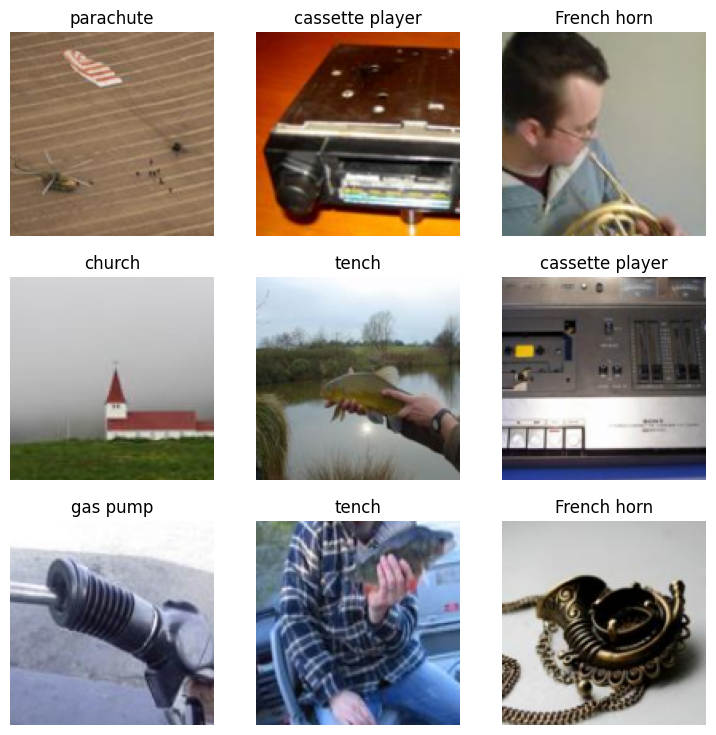

In [45]:
dls = dsets.dataloaders(after_item=item_tfms, after_batch=batch_tfms, bs=64, num_workers=2)

dls.show_batch()

### Loading the data with the low-level API
**Custom new task - [siamese](https://docs.fast.ai/tutorial.siamese.html)**

## Training

In [46]:
dls.vocab

['English springer', 'French horn', 'cassette player', 'chain saw', 'church', 'garbage truck', 'gas pump', 'golf ball', 'parachute', 'tench']

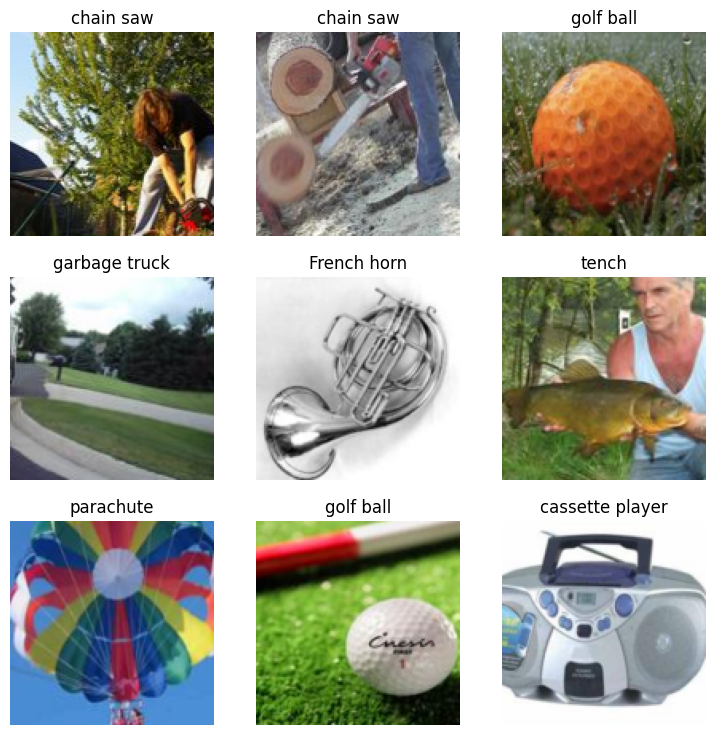

In [47]:
dls.show_batch()

### Building a Learner

In [48]:
learn = vision_learner(dls, resnet34, metrics=accuracy, pretrained=False)
learn.fit_one_cycle(5, 5e-3)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


epoch,train_loss,valid_loss,accuracy,time
0,2.419205,59.044083,0.161529,00:45
1,2.306103,2.010546,0.300127,00:34
2,1.840133,2.094138,0.362803,00:34
3,1.608935,1.344167,0.544459,00:33
4,1.336520,1.219796,0.620637,00:33


In [49]:
doc(vision_learner)

That’s a start. But since we are not using a pretrained model, why not use a different architecture? fastai comes with a version of the resnets models that have all the tricks from modern research incorporated. While there is no pretrained model using those at the time of writing this tutorial, we can certainly use them here. For this, we just need to use the `Learner` class. It takes our `DataLoaders` and a PyTorch model, at the minimum. Here we can use `xresnet34` and since we have 10 classes, we specify **`n_out=10`**

In [50]:
learn = Learner(dls, xresnet34(n_out=10), metrics=accuracy)

SuggestedLRs(valley=0.0003311311302240938)

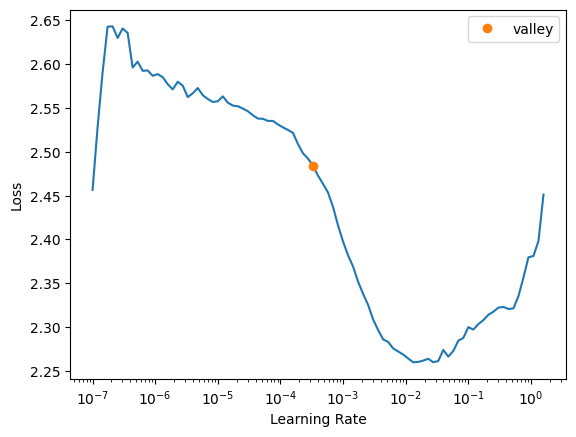

In [51]:
learn.lr_find()

In [53]:
learn.fit_one_cycle(5, 1e-3)

epoch,train_loss,valid_loss,accuracy,time
0,1.608990,1.451670,0.517452,00:36
1,1.198202,1.768261,0.481274,00:34
2,0.967325,0.964210,0.682803,00:34
3,0.780422,0.768654,0.758981,00:35
4,0.685723,0.716272,0.775032,00:33


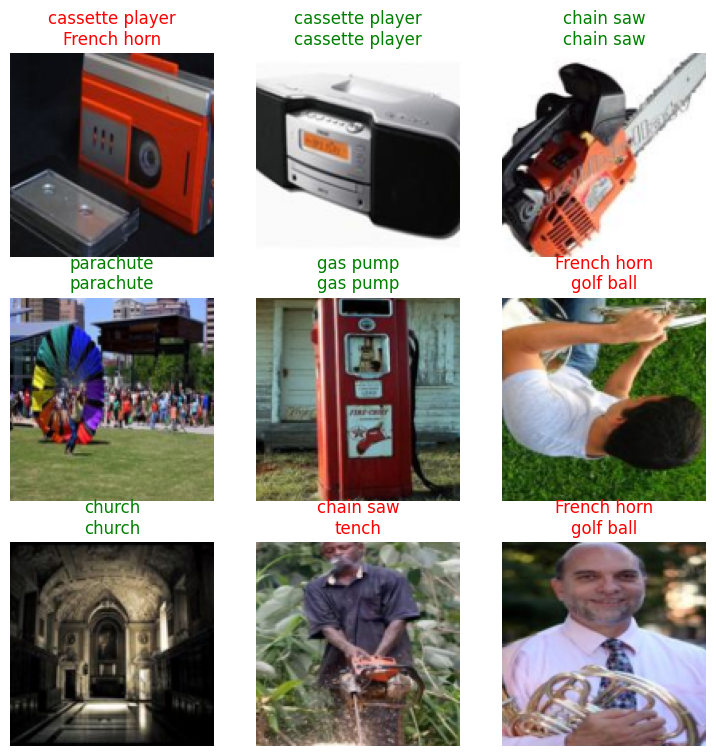

In [54]:
learn.show_results()

### [Changing the loss function](https://docs.fast.ai/tutorial.imagenette.html#changing-the-loss-function)

As an example, let’s look at how to implement a custom loss function doing label smoothing (this is already in fastai as LabelSmoothingCrossEntropy).

In [55]:
class LabelSmoothingCE(Module):
    def __init__(self, eps=0.1, reduction='mean'): self.eps,self.reduction = eps,reduction

    def forward(self, output, target):
        c = output.size()[-1]
        log_preds = F.log_softmax(output, dim=-1)
        if self.reduction=='sum': loss = -log_preds.sum()
        else:
            loss = -log_preds.sum(dim=-1) #We divide by that size at the return line so sum and not mean
            if self.reduction=='mean':  loss = loss.mean()
        return loss*self.eps/c + (1-self.eps) * F.nll_loss(log_preds, target.long(), reduction=self.reduction)

    def activation(self, out): return F.softmax(out, dim=-1)
    def decodes(self, out):    return out.argmax(dim=-1)

In [56]:
learn = Learner(dls, xresnet34(n_out=10), loss_func=LabelSmoothingCE(), metrics=accuracy)
learn.fit_one_cycle(5, 1e-3)

epoch,train_loss,valid_loss,accuracy,time
0,1.776094,1.824777,0.440000,00:46
1,1.440513,1.389838,0.637962,00:34
2,1.263469,1.292949,0.676178,00:34
3,1.137399,1.126970,0.752866,00:36
4,1.041999,1.082522,0.769936,00:40


It’s not training as well as before because label smoothing is a regularizing technique, so it needs more epochs to really kick in and give better results.

After training our model, we can indeed use **`predict`** and **`show_results`** and get proper results:

In [58]:
learn.predict(fnames[0])

('garbage truck',
 tensor(5),
 tensor([0.0073, 0.0372, 0.0260, 0.0363, 0.0456, 0.7470, 0.0740, 0.0085, 0.0087,
         0.0095]))

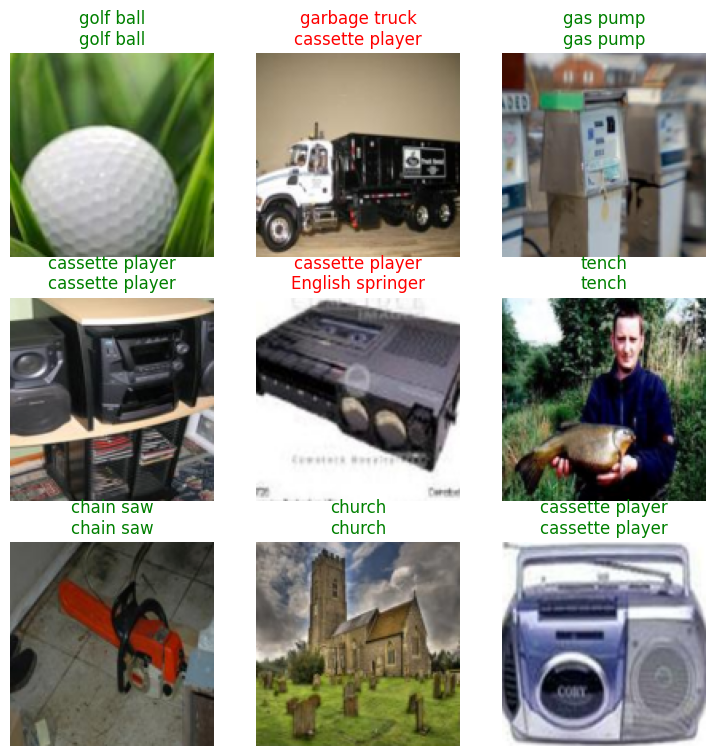

In [59]:
learn.show_results()

In [60]:
learn.show_training_loop()

Start Fit
   - before_fit     : [TrainEvalCallback, Recorder, ProgressCallback]
  Start Epoch Loop
     - before_epoch   : [Recorder, ProgressCallback]
    Start Train
       - before_train   : [TrainEvalCallback, Recorder, ProgressCallback]
      Start Batch Loop
         - before_batch   : [CastToTensor]
         - after_pred     : []
         - after_loss     : []
         - before_backward: []
         - before_step    : []
         - after_step     : []
         - after_cancel_batch: []
         - after_batch    : [TrainEvalCallback, Recorder, ProgressCallback]
      End Batch Loop
    End Train
     - after_cancel_train: [Recorder]
     - after_train    : [Recorder, ProgressCallback]
    Start Valid
       - before_validate: [TrainEvalCallback, Recorder, ProgressCallback]
      Start Batch Loop
         - **CBs same as train batch**: []
      End Batch Loop
    End Valid
     - after_cancel_validate: [Recorder]
     - after_validate : [Recorder, ProgressCallback]
  End Epoch Loop

### Changing the optimizer

In [61]:
doc(OptimWrapper)

In [62]:
pytorch_adamw = partial(OptimWrapper, opt=torch.optim.AdamW)

In [63]:
learn = Learner(dls, xresnet18(), lr=1e-2, metrics=accuracy,
                loss_func=LabelSmoothingCrossEntropy(),
                opt_func=partial(pytorch_adamw, weight_decay=0.01, eps=1e-3))

SuggestedLRs(valley=0.0020892962347716093)

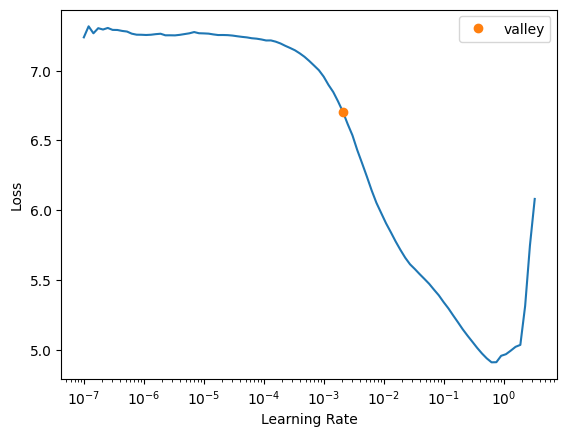

In [64]:
learn.lr_find()

In [65]:
learn.fit_one_cycle(5, 5e-3)

epoch,train_loss,valid_loss,accuracy,time
0,2.671835,2.686143,0.394140,00:34
1,2.153985,2.393043,0.524586,00:33
2,1.923296,1.932485,0.664968,00:30
3,1.745408,1.695678,0.767389,00:31
4,1.632447,1.632912,0.784204,00:31


### [Changing the training loop with a Callback](https://docs.fast.ai/tutorial.imagenette.html#changing-the-training-loop-with-a-callback)

Here we will write a simple **Callback** applying **mixup** to our training (the version we will write is specific to our problem, use fastai’s **MixUp** in other settings).

Mixup consists in changing the inputs by mixing two different inputs and making a linear combination of them:

# Mid-tier data API - Pets
Using `Datasets`, `Pipeline`, `TfmdLists` and `Transform` in computer vision

## Overview

## Processing data

### Transform

### Pipeline

## Loading the pets dataset using only Transform

### Using decodes for showing processed data

### Setting up the internal state with a setups

### Combining our Transform with data augmentation in a Pipeline

## TfmdLists and Datasets

### One pipeline makes a TfmdLists

### Traning and validation set

### Getting to DataLoaders

### Using Datasets

### Segmentation

## Adding a test dataloader for inference

# Chest X-ray model
In this tutorial we will build a classifier that distinguishes between chest X-rays with pneumothorax and chest X-rays without pneumothorax. The image data is loaded directly from the DICOM source files, so no prior DICOM data handling is needed. This tutorial also goes through what DICOM images are and review at a high level how to evaluate the results of the classifier.

# Transformers
An example of how to incorporate the transfomers library from HuggingFace with fastai

# Notebook distributed training
Using Accelerate to launch a training script from your notebook